In [1]:
%config Completer.use_jedi = False
import warnings
warnings.filterwarnings(action="ignore")
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['axes.unicode_minus'] = False
#plt.rcParams('font.family') = 'NanumGothicCoding'
#plt.rcParams('font.size') = 16
import matplotlib.font_manager as fm
font = 'C:\\Windows\\Fonts\\NanumGothicCoding.ttf'
fontprop = fm.FontProperties(fname=font, size=16).get_name()
plt.rc('font', family = fontprop)
plt.rc('font', size = 16)
import seaborn as sns
import missingno as msno
from plotnine import *

***
영업 중인 전국 상가 업소 동향
***

***
소상공인시장진흥공단_상가(상권)정보 중에서 서울과 부산 데이터만 읽어와서 하나의 데이터프레임으로 만들어  
csv파일로 저장한다.  

In [2]:
# 서울 상권 정보 데이터를 읽어온다.
#seoul_df = pd.read_csv('./data/shop_2024_03_seoul.csv')
#seoul_df.head()

In [3]:
# 부산 상권 정보 데이터를 읽어온다.
#busan_df = pd.read_csv('./data/shop_2024_03_busan.csv')
#busan_df.head()

In [4]:
# 서울과 부산의 상권 정보를 합친다.
#seoul_busan_df = pd.concat([seoul_df, busan_df], axis=0, ignore_index=True)
#seoul_busan_df.head()

In [5]:
# 서울과 부산 데이터를 읽어서 하나의 데이터프레임으로 만든 데이터를 csv파일로 저장한다.
# csv 파일로 저장할 때 인덱스를 제외하고 저장하려면 index=None 옵션을 사용한다.
#seoul_busan_df.to_csv('./data/seoul_busan_df.csv', index=None)

In [6]:
# 파이썬은 자바처럼 {}블록이 없서 사용한 변수가 메모리에서 자동으로 삭제되지 않기때문에
# 계속 메모리를 차지하는 문제가 발생하므로 del 명령을 실행해서 사용하지 않는 변수는 메모리에서
# 제거하는 것이 좋다.
#del seoul_df, busan_df

***
서울, 부산 데이터가 저장된 csv 파일을 읽어들인다.


In [7]:
seoul_busan_df = pd.read_csv('./data/seoul_busan_df.csv')
seoul_busan_df

,상가업소번호,상호명,지점명,상권업종대분류코드,상권업종대분류명,상권업종중분류코드,상권업종중분류명,상권업종소분류코드,상권업종소분류명,표준산업분류코드,...,건물관리번호,건물명,도로명주소,구우편번호,신우편번호,동정보,층정보,호정보,경도,위도
0,MA0101202210A0037544,영자's곱창,NaN,I2,음식,I201,한식,I20109,곱창 전골/구이,I56111,...,1121510100101690021003140,NaN,서울특별시 광진구 면목로 172,143900,4904,NaN,1,NaN,127.082832,37.568503
1,MA0101202210A0097916,호텔클로이,NaN,I1,숙박,I101,일반 숙박,I10102,여관/모텔,I55102,...,1114014500101300000014092,유성장,서울특별시 중구 을지로42길 11,100411,4561,NaN,NaN,NaN,127.005849,37.565708
2,MA0101202210A0096343,나라차중계태권도장,NaN,P1,교육,P106,기타 교육,P10601,태권도/무술학원,P85611,...,1135010600103640019010971,삼부프라자,서울특별시 노원구 한글비석로 242,139861,1734,NaN,NaN,NaN,127.076956,37.649226
3,MA0101202210A0093845,이상한스냅,NaN,M1,과학·기술,M113,사진 촬영,M11301,사진촬영업,M73303,...,1147010300100090004000001,백송주택,서울특별시 양천구 월정로 283,158822,7902,NaN,NaN,NaN,126.828832,37.542117
4,MA010120220805430767,토끼정,NaN,I2,음식,I201,한식,I20101,백반/한정식,I56111,...,1150010500107740012000001,마커스빌딩,서울특별시 강서구 마곡동로 55,157805,7802,NaN,2,NaN,126.833022,37.560053
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
622526,MA0101202310A0049018,용공장,NaN,I2,음식,I201,한식,I20107,돼지고기 구이/찜,I56111,...,2671025022103440010000001,NaN,부산광역시 기장군 기장읍 차성로390번길 23,619901,46056,NaN,1,NaN,129.216824,35.252482
622527,MA0101202310A0052436,유미노래방,NaN,I2,음식,I211,주점,I21101,일반 유흥 주점,I56211,...,2641011000102020009017615,NaN,부산광역시 금정구 서동로176번길 14-2,609849,46327,NaN,2,NaN,129.105208,35.214009
622528,MA0101202310A0048331,큰집밀양순대돼지국밥,부산역점,I2,음식,I201,한식,I20101,백반/한정식,I56111,...,2617010100103480002010381,NaN,부산광역시 동구 중앙대로231번길 5,601829,48815,NaN,1,NaN,129.040652,35.117817
622529,MA0101202310A0055762,바르미부산,서면점,I2,음식,I201,한식,I20101,백반/한정식,I56111,...,2623010300105030015004104,롯데백화점부산본점,부산광역시 부산진구 가야대로 772,614732,47285,NaN,9,NaN,129.056438,35.156810


***
읽어들인 데이터를 확인한다.
***

In [8]:
seoul_busan_df.isnull().sum()

상가업소번호            0
상호명               1
지점명          609954
상권업종대분류코드         0
상권업종대분류명          0
상권업종중분류코드         0
상권업종중분류명          0
상권업종소분류코드         0
상권업종소분류명          0
표준산업분류코드        126
표준산업분류명         126
시도코드              0
시도명               0
시군구코드             0
시군구명              0
행정동코드             0
행정동명              0
법정동코드             0
법정동명              0
지번코드              0
대지구분코드            0
대지구분명             0
지번본번지             4
지번부번지         94670
지번주소              0
도로명코드             0
도로명               0
건물본번지             1
건물부번지        536603
건물관리번호           36
건물명          346529
도로명주소             0
구우편번호             0
신우편번호             0
동정보          622531
층정보          215841
호정보          622531
경도                0
위도                0
dtype: int64

<AxesSubplot:>

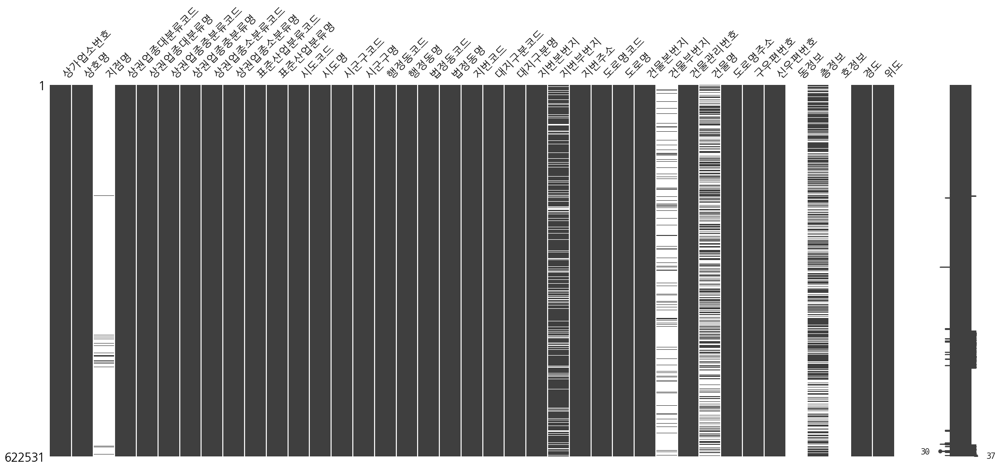

In [9]:
msno.matrix(seoul_busan_df)

***
분석 작업에 사용하지 않을 열을 제거한다.
***

In [10]:
seoul_busan_df.columns

Index(['상가업소번호', '상호명', '지점명', '상권업종대분류코드', '상권업종대분류명', '상권업종중분류코드',
       '상권업종중분류명', '상권업종소분류코드', '상권업종소분류명', '표준산업분류코드', '표준산업분류명', '시도코드',
       '시도명', '시군구코드', '시군구명', '행정동코드', '행정동명', '법정동코드', '법정동명', '지번코드',
       '대지구분코드', '대지구분명', '지번본번지', '지번부번지', '지번주소', '도로명코드', '도로명', '건물본번지',
       '건물부번지', '건물관리번호', '건물명', '도로명주소', '구우편번호', '신우편번호', '동정보', '층정보',
       '호정보', '경도', '위도'],
      dtype='object')

In [11]:
# drop() 메소드로 불필요한 열을 제거한다. -> 원본 데이터가 손상된다.
# drop() 메소드는 axis=0이 기본값이므로 axis를 생략하면 행 방향 데이터를 제거하려하기때문에
# 에러가 발생되므로 axis 옵션값을 1로 지정해서 열을 제거한다.
#seoul_busan_df = seoul_busan_df.drop('동정보') #seoul_busan_df.drop(['동정보'], axis=0), 에러
#seoul_busan_df = seoul_busan_df.drop('동정보', axis=1)
# 1개의 열을 제거하려면 위와 같이 제거할 열의 이름만 쓰면 되지만,
# 2개 이상의 열을 제거하려면 제거할 column을 리스트로 묶어서 drop() 메소드에 전달한다.
#seoul_busan_df.drop(['층정보', '호정보'], axis=1, inplace=True)
#seoul_busan_df.columns

***
분석 작업에 사용할 열을 추려낸다.
***

In [12]:
seoul_busan_df.columns

Index(['상가업소번호', '상호명', '지점명', '상권업종대분류코드', '상권업종대분류명', '상권업종중분류코드',
       '상권업종중분류명', '상권업종소분류코드', '상권업종소분류명', '표준산업분류코드', '표준산업분류명', '시도코드',
       '시도명', '시군구코드', '시군구명', '행정동코드', '행정동명', '법정동코드', '법정동명', '지번코드',
       '대지구분코드', '대지구분명', '지번본번지', '지번부번지', '지번주소', '도로명코드', '도로명', '건물본번지',
       '건물부번지', '건물관리번호', '건물명', '도로명주소', '구우편번호', '신우편번호', '동정보', '층정보',
       '호정보', '경도', '위도'],
      dtype='object')

In [13]:
refined_columns = [
        '상호명', '지점명', '상권업종대분류명', '상권업종중분류명', '상권업종소분류명',
       '시도명', '시군구명', '행정동명', '법정동명','지번주소', '도로명주소', '경도', '위도'
        ]
refined_df = seoul_busan_df[refined_columns]
refined_df

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도
0,영자's곱창,NaN,음식,한식,곱창 전골/구이,서울특별시,광진구,중곡3동,중곡동,서울특별시 광진구 중곡동 169-21,서울특별시 광진구 면목로 172,127.082832,37.568503
1,호텔클로이,NaN,숙박,일반 숙박,여관/모텔,서울특별시,중구,광희동,광희동1가,서울특별시 중구 광희동1가 130,서울특별시 중구 을지로42길 11,127.005849,37.565708
2,나라차중계태권도장,NaN,교육,기타 교육,태권도/무술학원,서울특별시,노원구,중계본동,중계동,서울특별시 노원구 중계동 364-19,서울특별시 노원구 한글비석로 242,127.076956,37.649226
3,이상한스냅,NaN,과학·기술,사진 촬영,사진촬영업,서울특별시,양천구,신월5동,신월동,서울특별시 양천구 신월동 9-4,서울특별시 양천구 월정로 283,126.828832,37.542117
4,토끼정,NaN,음식,한식,백반/한정식,서울특별시,강서구,가양1동,마곡동,서울특별시 강서구 마곡동 774-12,서울특별시 강서구 마곡동로 55,126.833022,37.560053
...,...,...,...,...,...,...,...,...,...,...,...,...,...
622526,용공장,NaN,음식,한식,돼지고기 구이/찜,부산광역시,기장군,기장읍,기장읍,부산광역시 기장군 기장읍 교리 344-10,부산광역시 기장군 기장읍 차성로390번길 23,129.216824,35.252482
622527,유미노래방,NaN,음식,주점,일반 유흥 주점,부산광역시,금정구,서2동,서동,부산광역시 금정구 서동 202-9,부산광역시 금정구 서동로176번길 14-2,129.105208,35.214009
622528,큰집밀양순대돼지국밥,부산역점,음식,한식,백반/한정식,부산광역시,동구,초량2동,초량동,부산광역시 동구 초량동 348-2,부산광역시 동구 중앙대로231번길 5,129.040652,35.117817
622529,바르미부산,서면점,음식,한식,백반/한정식,부산광역시,부산진구,부전2동,부전동,부산광역시 부산진구 부전동 503-15,부산광역시 부산진구 가야대로 772,129.056438,35.156810


In [14]:
refined_df.isna().sum()

상호명              1
지점명         609954
상권업종대분류명         0
상권업종중분류명         0
상권업종소분류명         0
시도명              0
시군구명             0
행정동명             0
법정동명             0
지번주소             0
도로명주소            0
경도               0
위도               0
dtype: int64

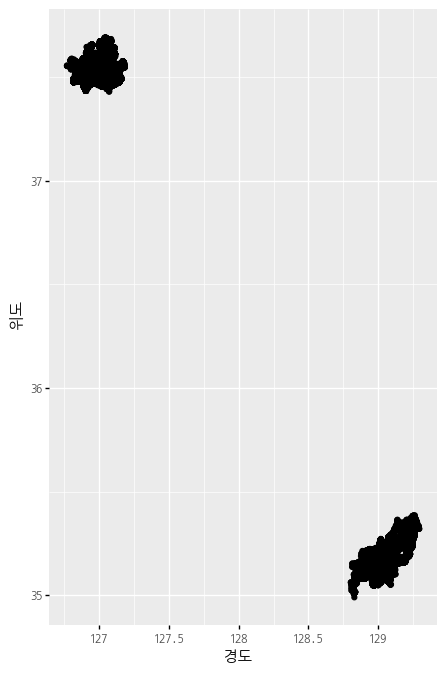

<ggplot: (-9223371918740240766)>

In [15]:
(
    ggplot(refined_df, aes(x = '경도', y = '위도'))
    + geom_point()
    + theme(text=element_text(family='NanumGothicCoding'), figure_size=[5, 8])
)


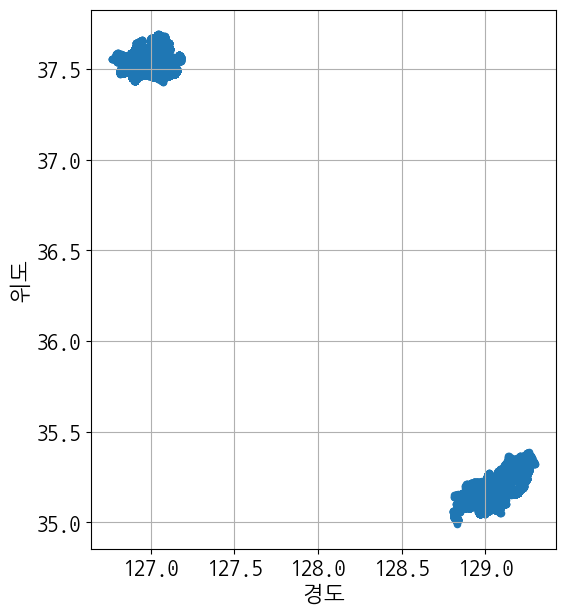

In [16]:
refined_df.plot.scatter(x = '경도', y = '위도', figsize=[6, 7], grid=True)
plt.show()

***
데이터프레임에서 서울 데이터만 추출한다

In [17]:
refined_df

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도
0,영자's곱창,NaN,음식,한식,곱창 전골/구이,서울특별시,광진구,중곡3동,중곡동,서울특별시 광진구 중곡동 169-21,서울특별시 광진구 면목로 172,127.082832,37.568503
1,호텔클로이,NaN,숙박,일반 숙박,여관/모텔,서울특별시,중구,광희동,광희동1가,서울특별시 중구 광희동1가 130,서울특별시 중구 을지로42길 11,127.005849,37.565708
2,나라차중계태권도장,NaN,교육,기타 교육,태권도/무술학원,서울특별시,노원구,중계본동,중계동,서울특별시 노원구 중계동 364-19,서울특별시 노원구 한글비석로 242,127.076956,37.649226
3,이상한스냅,NaN,과학·기술,사진 촬영,사진촬영업,서울특별시,양천구,신월5동,신월동,서울특별시 양천구 신월동 9-4,서울특별시 양천구 월정로 283,126.828832,37.542117
4,토끼정,NaN,음식,한식,백반/한정식,서울특별시,강서구,가양1동,마곡동,서울특별시 강서구 마곡동 774-12,서울특별시 강서구 마곡동로 55,126.833022,37.560053
...,...,...,...,...,...,...,...,...,...,...,...,...,...
622526,용공장,NaN,음식,한식,돼지고기 구이/찜,부산광역시,기장군,기장읍,기장읍,부산광역시 기장군 기장읍 교리 344-10,부산광역시 기장군 기장읍 차성로390번길 23,129.216824,35.252482
622527,유미노래방,NaN,음식,주점,일반 유흥 주점,부산광역시,금정구,서2동,서동,부산광역시 금정구 서동 202-9,부산광역시 금정구 서동로176번길 14-2,129.105208,35.214009
622528,큰집밀양순대돼지국밥,부산역점,음식,한식,백반/한정식,부산광역시,동구,초량2동,초량동,부산광역시 동구 초량동 348-2,부산광역시 동구 중앙대로231번길 5,129.040652,35.117817
622529,바르미부산,서면점,음식,한식,백반/한정식,부산광역시,부산진구,부전2동,부전동,부산광역시 부산진구 부전동 503-15,부산광역시 부산진구 가야대로 772,129.056438,35.156810


In [18]:
# 시도명 열에 '서울특별시'라고만 입력이 되어있다면 아래와 같이 실행하면 된다.
#refined_df_seoul = refined_df[refined_df['시도명'] == '서울특별시']

# 시도명 열에 '서울특별시', '서울시', '서울'과 같이 입력값이 혼재되어있다면 아래와 같이 논리 연산을 해야한다.
# pandas에서 불리언 인덱싱시 and 조건은 '&'를 사용하고, or 조건은 '|'를 사용한다.
# and, or 조건 지정시 관계 연산자가 사용된(브로드캐스팅이 실행되는) 부분을 반드시 ()로 묶어야 한다.
#refined_df_seoul = refined_df[(refined_df['시도명'] == '서울특별시') |
#                              (refined_df['시도명'] == '서울시') |
#                              (refined_df['시도명'] == '서울') ]

# 시도명열 또는 지번주소열 또는 도로명주소열의 입력값의 앞 2글자가 '서울'인 데이터를 얻어온다.
#refined_df[refined_df['시도명'].str[:2] == '서울']
#refined_df[refined_df['지번주소'].str[:2] == '서울']
#refined_df[refined_df['도로명주소'].str[:2] == '서울']

# 시도명열 또는 지번주소열 또는 도로명주소열의 입력값에 '서울'이 포함된 데이터를 얻어온다.
#refined_df[refined_df.시도명.str.find('서울') >= 0]
#refined_df[refined_df.시도명.str.count('서울') >= 1]

# 시도명열 또는 지번주소열 또는 도로명주소열의 입력값이 '서울'로 시작하는 데이터를 얻어온다.
#refined_df[refined_df.시도명.str.find('서울') == 0]
#startwith() 메소드는 인수로 지정한 문자열로 시작하면 True, 그렇지 않으면 False를 리턴한다.
#endwith() 메소드는 인수로 지정한 문자열로 끝나면 True, 그렇지 않으면 False를 리턴한다.
refined_df_seoul = refined_df[refined_df.시도명.str.startswith('서울')]
refined_df_seoul

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도
0,영자's곱창,NaN,음식,한식,곱창 전골/구이,서울특별시,광진구,중곡3동,중곡동,서울특별시 광진구 중곡동 169-21,서울특별시 광진구 면목로 172,127.082832,37.568503
1,호텔클로이,NaN,숙박,일반 숙박,여관/모텔,서울특별시,중구,광희동,광희동1가,서울특별시 중구 광희동1가 130,서울특별시 중구 을지로42길 11,127.005849,37.565708
2,나라차중계태권도장,NaN,교육,기타 교육,태권도/무술학원,서울특별시,노원구,중계본동,중계동,서울특별시 노원구 중계동 364-19,서울특별시 노원구 한글비석로 242,127.076956,37.649226
3,이상한스냅,NaN,과학·기술,사진 촬영,사진촬영업,서울특별시,양천구,신월5동,신월동,서울특별시 양천구 신월동 9-4,서울특별시 양천구 월정로 283,126.828832,37.542117
4,토끼정,NaN,음식,한식,백반/한정식,서울특별시,강서구,가양1동,마곡동,서울특별시 강서구 마곡동 774-12,서울특별시 강서구 마곡동로 55,126.833022,37.560053
...,...,...,...,...,...,...,...,...,...,...,...,...,...
475231,마스터부동산중개사무소,NaN,부동산,부동산 서비스,부동산 중개/대리업,서울특별시,강서구,가양1동,마곡동,서울특별시 강서구 마곡동 797-1,서울특별시 강서구 공항대로 247,126.834810,37.559341
475232,그릿뷰티아카데미학원,NaN,교육,기타 교육,기타 기술/직업 훈련학원,서울특별시,중랑구,면목3.8동,면목동,서울특별시 중랑구 면목동 472-5,서울특별시 중랑구 사가정로 409,127.090213,37.580598
475233,최지원렌탈,NaN,수리·개인,가전제품 수리,가전제품 수리업,서울특별시,금천구,독산3동,독산동,서울특별시 금천구 독산동 1144,서울특별시 금천구 시흥대로150길 6,126.899154,37.475441
475234,매직노래연습장,NaN,예술·스포츠,유원지·오락,노래방,서울특별시,구로구,구로4동,구로동,서울특별시 구로구 구로동 139-124,서울특별시 구로구 구로중앙로 23,126.891074,37.492071


In [19]:
#'~'는 ~가 아닌 것을 의미한다. -> 논리부정, not 연산자
refined_df_seoul_expect = refined_df[~refined_df.시도명.str.startswith('서울')]
refined_df_seoul_expect

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도
475236,선해횟집,NaN,음식,한식,횟집,부산광역시,금정구,금사회동동,금사동,부산광역시 금정구 금사동 30-27,부산광역시 금정구 사천로3번길 2,129.113321,35.223363
475237,미즈노,NaN,소매,섬유·의복·신발 소매,기타 의류 소매업,부산광역시,해운대구,우2동,우동,부산광역시 해운대구 우동 1496,부산광역시 해운대구 센텀남대로 59,129.131099,35.169873
475238,리스트,NaN,소매,섬유·의복·신발 소매,여성 의류 소매업,부산광역시,강서구,명지1동,명지동,부산광역시 강서구 명지동 3438,부산광역시 강서구 명지국제6로 168,128.918174,35.093125
475239,눈썹그리기교실동안눈썹,NaN,수리·개인,이용·미용,피부 관리실,부산광역시,북구,화명3동,화명동,부산광역시 북구 화명동 2272-5,부산광역시 북구 화명대로 31,129.011641,35.235217
475240,안심공인중개사무소,NaN,부동산,부동산 서비스,부동산 중개/대리업,부산광역시,연제구,연산9동,연산동,부산광역시 연제구 연산동 398-25,부산광역시 연제구 연안로13번길 85,129.102386,35.188814
...,...,...,...,...,...,...,...,...,...,...,...,...,...
622526,용공장,NaN,음식,한식,돼지고기 구이/찜,부산광역시,기장군,기장읍,기장읍,부산광역시 기장군 기장읍 교리 344-10,부산광역시 기장군 기장읍 차성로390번길 23,129.216824,35.252482
622527,유미노래방,NaN,음식,주점,일반 유흥 주점,부산광역시,금정구,서2동,서동,부산광역시 금정구 서동 202-9,부산광역시 금정구 서동로176번길 14-2,129.105208,35.214009
622528,큰집밀양순대돼지국밥,부산역점,음식,한식,백반/한정식,부산광역시,동구,초량2동,초량동,부산광역시 동구 초량동 348-2,부산광역시 동구 중앙대로231번길 5,129.040652,35.117817
622529,바르미부산,서면점,음식,한식,백반/한정식,부산광역시,부산진구,부전2동,부전동,부산광역시 부산진구 부전동 503-15,부산광역시 부산진구 가야대로 772,129.056438,35.156810


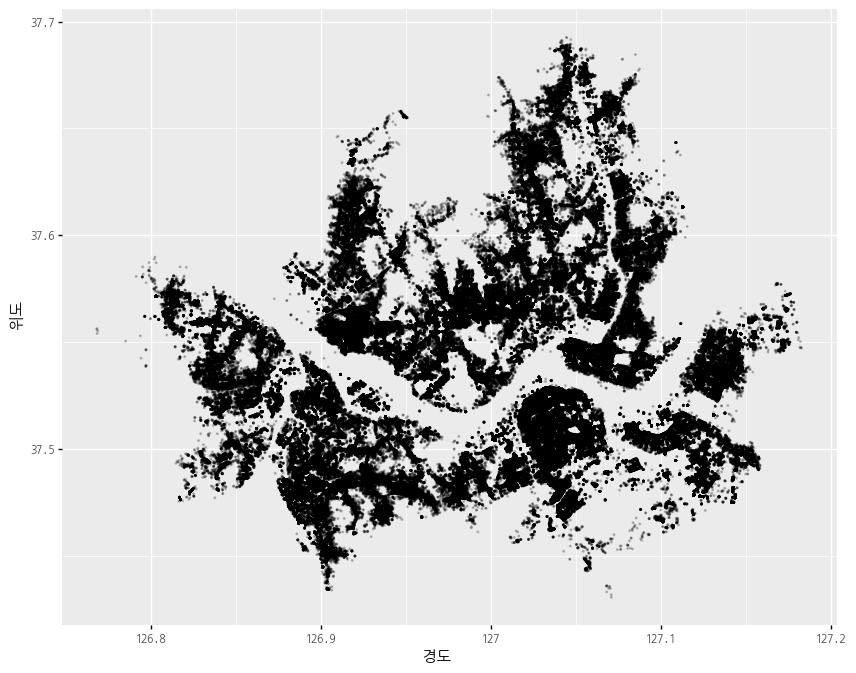

<ggplot: (-9223371918742813033)>

In [20]:
# 서울만 시각화해보면 서울 지도와 비슷하게 나온다.
(
    ggplot(refined_df_seoul, aes(x = '경도', y = '위도'))
    + geom_point(size=0.2, alpha=0.2)
    + theme(text=element_text(family='NanumGothicCoding'), figure_size=[10, 8])
)


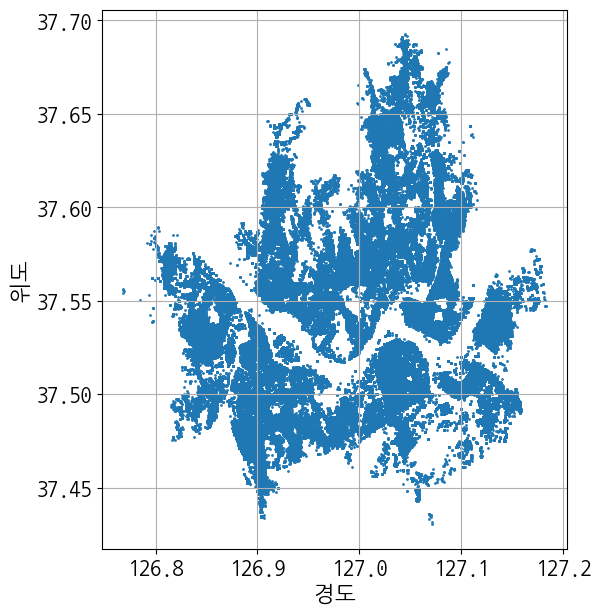

In [21]:
refined_df_seoul.plot.scatter(x = '경도', y = '위도', figsize=[6, 7], grid=True, s=1)
plt.show()

***
seoul_busan_df 데이터프레임의 도로명주소열을 활용해서 '시도', '구군', '도로명' 파생 변수를 추가한다.
***

In [22]:
# split() 메소드에 expand=True 옵션을 지정해서 공백을 경계로 문자열을 서로 다른 열(데이터프레임) 구분해서
#'시도', '구군', '도로명' 열을 만든다.
#print(type(refined_df.도로명주소[:1])) #<class 'pandas.core.series.Series'>
print(refined_df.도로명주소[:1])
#print(type(refined_df.도로명주소[:1].str)) #<class 'pandas.core.strings.accessor.StringMethods'>
print(refined_df.도로명주소[:1].str)
#print(type(refined_df.도로명주소[:1].str.split(' '))) # <class 'pandas.core.series.Series'>
print(refined_df.도로명주소[:1].str.split(' '))
print('*'* 100)
#print(type(refined_df.도로명주소[:1].str.split(' ', expand=True)))#<class 'pandas.core.frame.DataFrame'>
print(refined_df.도로명주소[:1].str.split(' ', expand=True))
print('*'* 100)
print(refined_df.도로명주소[:1].str.split(' ', expand=True)[0])
print(refined_df.도로명주소[:1].str.split(' ', expand=True)[1])
print(refined_df.도로명주소[:1].str.split(' ', expand=True)[2])
print(refined_df.도로명주소[:1].str.split(' ', expand=True)[3])

0    서울특별시 광진구 면목로 172
Name: 도로명주소, dtype: object
0    [서울특별시, 광진구, 면목로, 172]
Name: 도로명주소, dtype: object
****************************************************************************************************
       0    1    2    3
0  서울특별시  광진구  면목로  172
****************************************************************************************************
0    서울특별시
Name: 0, dtype: object
0    광진구
Name: 1, dtype: object
0    면목로
Name: 2, dtype: object
0    172
Name: 3, dtype: object


In [23]:
refined_df['시도'] = refined_df.도로명주소.str.split(' ', expand=True)[0]
refined_df['구군'] = refined_df.도로명주소.str.split(' ', expand=True)[1]
refined_df['도로명'] = refined_df.도로명주소.str.split(' ', expand=True)[2]
refined_df

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
0,영자's곱창,NaN,음식,한식,곱창 전골/구이,서울특별시,광진구,중곡3동,중곡동,서울특별시 광진구 중곡동 169-21,서울특별시 광진구 면목로 172,127.082832,37.568503,서울특별시,광진구,면목로
1,호텔클로이,NaN,숙박,일반 숙박,여관/모텔,서울특별시,중구,광희동,광희동1가,서울특별시 중구 광희동1가 130,서울특별시 중구 을지로42길 11,127.005849,37.565708,서울특별시,중구,을지로42길
2,나라차중계태권도장,NaN,교육,기타 교육,태권도/무술학원,서울특별시,노원구,중계본동,중계동,서울특별시 노원구 중계동 364-19,서울특별시 노원구 한글비석로 242,127.076956,37.649226,서울특별시,노원구,한글비석로
3,이상한스냅,NaN,과학·기술,사진 촬영,사진촬영업,서울특별시,양천구,신월5동,신월동,서울특별시 양천구 신월동 9-4,서울특별시 양천구 월정로 283,126.828832,37.542117,서울특별시,양천구,월정로
4,토끼정,NaN,음식,한식,백반/한정식,서울특별시,강서구,가양1동,마곡동,서울특별시 강서구 마곡동 774-12,서울특별시 강서구 마곡동로 55,126.833022,37.560053,서울특별시,강서구,마곡동로
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
622526,용공장,NaN,음식,한식,돼지고기 구이/찜,부산광역시,기장군,기장읍,기장읍,부산광역시 기장군 기장읍 교리 344-10,부산광역시 기장군 기장읍 차성로390번길 23,129.216824,35.252482,부산광역시,기장군,기장읍
622527,유미노래방,NaN,음식,주점,일반 유흥 주점,부산광역시,금정구,서2동,서동,부산광역시 금정구 서동 202-9,부산광역시 금정구 서동로176번길 14-2,129.105208,35.214009,부산광역시,금정구,서동로176번길
622528,큰집밀양순대돼지국밥,부산역점,음식,한식,백반/한정식,부산광역시,동구,초량2동,초량동,부산광역시 동구 초량동 348-2,부산광역시 동구 중앙대로231번길 5,129.040652,35.117817,부산광역시,동구,중앙대로231번길
622529,바르미부산,서면점,음식,한식,백반/한정식,부산광역시,부산진구,부전2동,부전동,부산광역시 부산진구 부전동 503-15,부산광역시 부산진구 가야대로 772,129.056438,35.156810,부산광역시,부산진구,가야대로


In [24]:
# '시도', '구군', '도로명' 열이 추가된 원본 데이터프레임(refined_df)에서 서울만 다시 추출한다.
refined_df_seoul = refined_df[refined_df['시도명'] == '서울특별시']
refined_df_seoul

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
0,영자's곱창,NaN,음식,한식,곱창 전골/구이,서울특별시,광진구,중곡3동,중곡동,서울특별시 광진구 중곡동 169-21,서울특별시 광진구 면목로 172,127.082832,37.568503,서울특별시,광진구,면목로
1,호텔클로이,NaN,숙박,일반 숙박,여관/모텔,서울특별시,중구,광희동,광희동1가,서울특별시 중구 광희동1가 130,서울특별시 중구 을지로42길 11,127.005849,37.565708,서울특별시,중구,을지로42길
2,나라차중계태권도장,NaN,교육,기타 교육,태권도/무술학원,서울특별시,노원구,중계본동,중계동,서울특별시 노원구 중계동 364-19,서울특별시 노원구 한글비석로 242,127.076956,37.649226,서울특별시,노원구,한글비석로
3,이상한스냅,NaN,과학·기술,사진 촬영,사진촬영업,서울특별시,양천구,신월5동,신월동,서울특별시 양천구 신월동 9-4,서울특별시 양천구 월정로 283,126.828832,37.542117,서울특별시,양천구,월정로
4,토끼정,NaN,음식,한식,백반/한정식,서울특별시,강서구,가양1동,마곡동,서울특별시 강서구 마곡동 774-12,서울특별시 강서구 마곡동로 55,126.833022,37.560053,서울특별시,강서구,마곡동로
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475231,마스터부동산중개사무소,NaN,부동산,부동산 서비스,부동산 중개/대리업,서울특별시,강서구,가양1동,마곡동,서울특별시 강서구 마곡동 797-1,서울특별시 강서구 공항대로 247,126.834810,37.559341,서울특별시,강서구,공항대로
475232,그릿뷰티아카데미학원,NaN,교육,기타 교육,기타 기술/직업 훈련학원,서울특별시,중랑구,면목3.8동,면목동,서울특별시 중랑구 면목동 472-5,서울특별시 중랑구 사가정로 409,127.090213,37.580598,서울특별시,중랑구,사가정로
475233,최지원렌탈,NaN,수리·개인,가전제품 수리,가전제품 수리업,서울특별시,금천구,독산3동,독산동,서울특별시 금천구 독산동 1144,서울특별시 금천구 시흥대로150길 6,126.899154,37.475441,서울특별시,금천구,시흥대로150길
475234,매직노래연습장,NaN,예술·스포츠,유원지·오락,노래방,서울특별시,구로구,구로4동,구로동,서울특별시 구로구 구로동 139-124,서울특별시 구로구 구로중앙로 23,126.891074,37.492071,서울특별시,구로구,구로중앙로


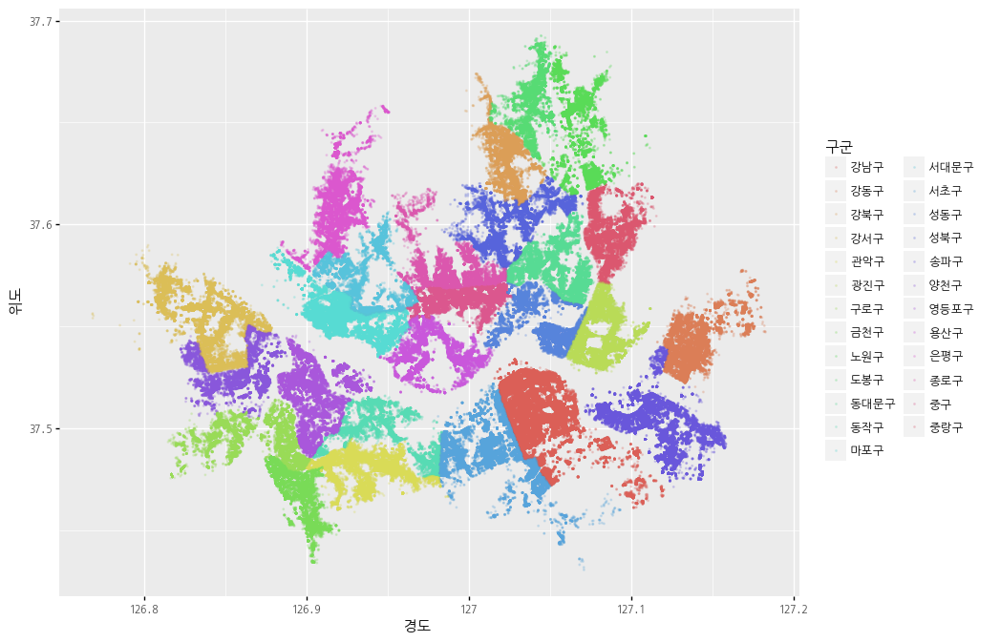

<ggplot: (-9223371918743032786)>

In [25]:
(
    ggplot(refined_df_seoul, aes(x = '경도', y = '위도', color='구군'))
    + geom_point(size=0.2, alpha=0.2)
    + theme(text=element_text(family='NanumGothicCoding'), figure_size=[10, 8])
)

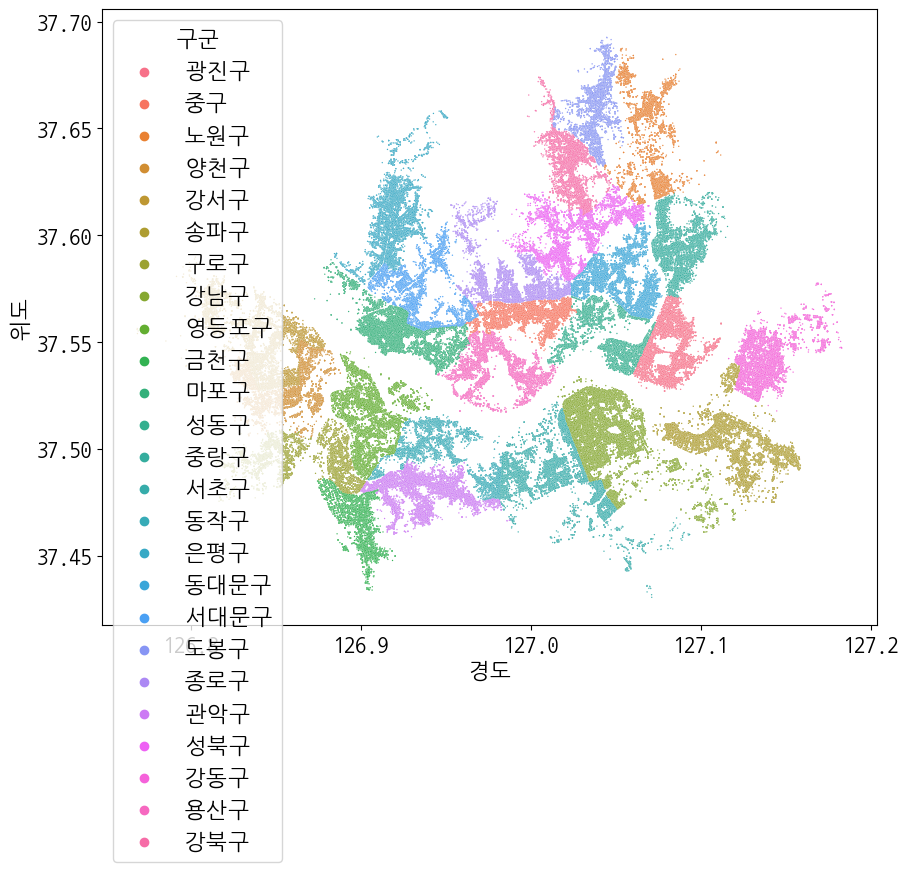

In [26]:
plt.figure(figsize=[10, 8])
sns.scatterplot(refined_df_seoul, x='경도', y='위도', s=1, hue='구군')
plt.show()

***
상권 업종 대분류 시각화
***

In [27]:
set(refined_df_seoul['상권업종대분류명'])

{'과학·기술', '교육', '보건의료', '부동산', '소매', '수리·개인', '숙박', '시설관리·임대', '예술·스포츠', '음식'}

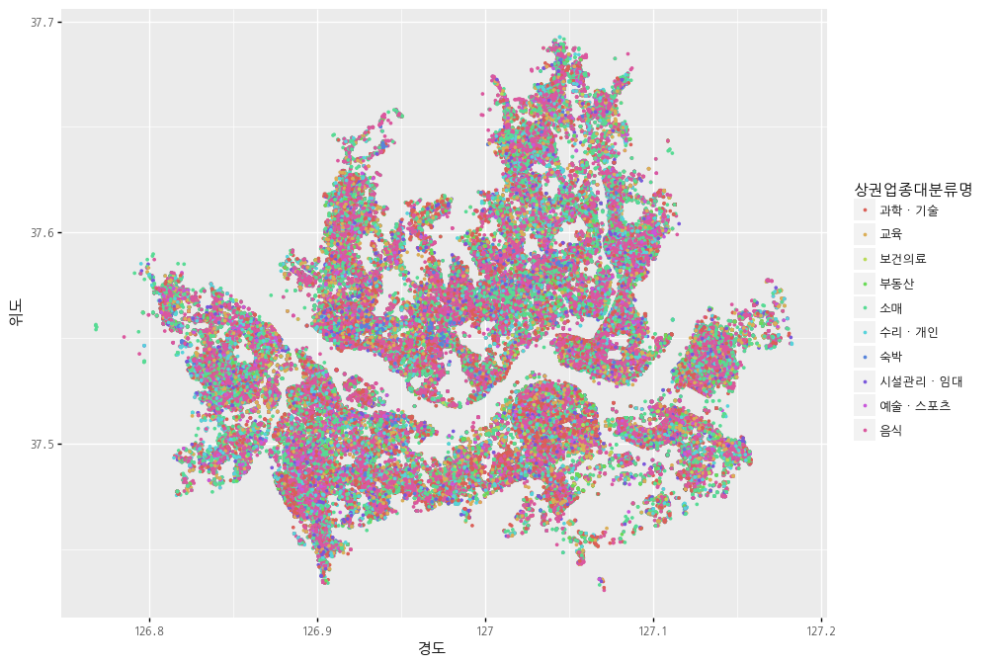

<ggplot: (118111969775)>

In [28]:
(
    ggplot(refined_df_seoul, aes(x='경도', y='위도', color='상권업종대분류명'))
    + geom_point(size=0.5)
    + theme(text=element_text(family='NanumGothicCoding'), figure_size=[10, 8])
)

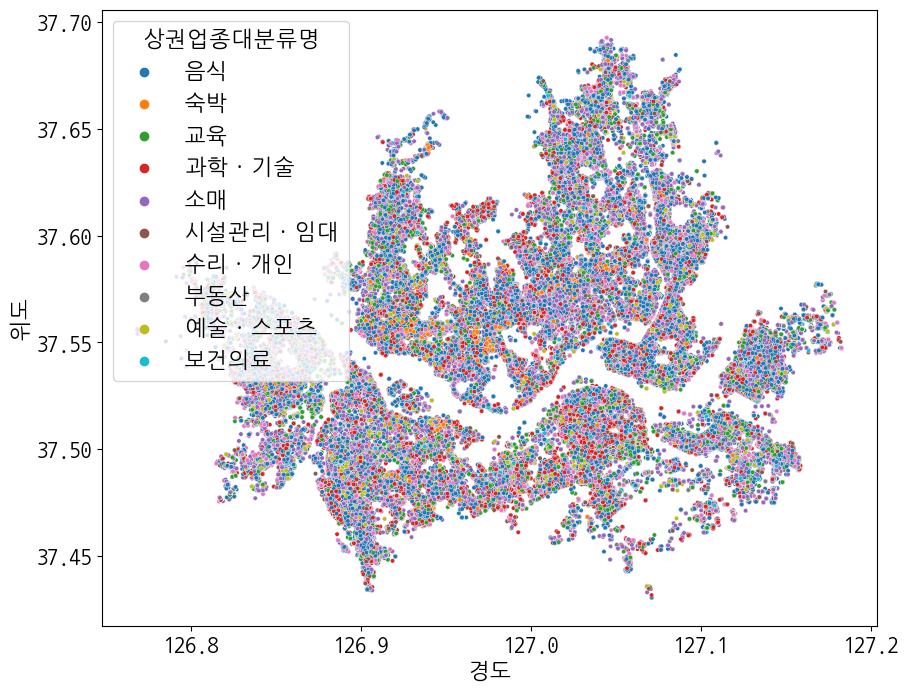

In [29]:
plt.figure(figsize=[10, 8])
sns.scatterplot(refined_df_seoul, x='경도', y='위도', s=10, hue='상권업종대분류명')
plt.show()

***
교육과 관련된 정보 시각화
***

In [30]:
related_edu_seoul = refined_df_seoul[refined_df_seoul['상권업종대분류명'] == '교육']
related_edu_seoul

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
2,나라차중계태권도장,NaN,교육,기타 교육,태권도/무술학원,서울특별시,노원구,중계본동,중계동,서울특별시 노원구 중계동 364-19,서울특별시 노원구 한글비석로 242,127.076956,37.649226,서울특별시,노원구,한글비석로
11,볼벤,NaN,교육,기타 교육,기타 기술/직업 훈련학원,서울특별시,마포구,성산1동,성산동,서울특별시 마포구 성산동 214-20,서울특별시 마포구 월드컵로30다길 41,126.908665,37.562237,서울특별시,마포구,월드컵로30다길
27,엑스퍼트짐,NaN,교육,기타 교육,레크리에이션 교육기관,서울특별시,은평구,응암3동,응암동,서울특별시 은평구 응암동 119-1,서울특별시 은평구 응암로 269,126.918749,37.596001,서울특별시,은평구,응암로
39,율립연구소,NaN,교육,기타 교육,요가/필라테스 학원,서울특별시,송파구,위례동,장지동,서울특별시 송파구 장지동 881,서울특별시 송파구 위례광장로 188,127.142381,37.481079,서울특별시,송파구,위례광장로
66,춤연,NaN,교육,기타 교육,기타 예술/스포츠 교육기관,서울특별시,서초구,양재1동,양재동,서울특별시 서초구 양재동 89-4,서울특별시 서초구 양재천로29길 3,127.042226,37.479264,서울특별시,서초구,양재천로29길
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475195,클레프온음악교습소,NaN,교육,기타 교육,음악학원,서울특별시,성동구,행당1동,행당동,서울특별시 성동구 행당동 380,서울특별시 성동구 고산자로2길 67,127.038026,37.556342,서울특별시,성동구,고산자로2길
475197,생동력연구소,NaN,교육,일반 교육,입시·교과학원,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 역삼동 831,서울특별시 강남구 강남대로 354,127.029714,37.494642,서울특별시,강남구,강남대로
475209,예히세라믹스,NaN,교육,기타 교육,기타 기술/직업 훈련학원,서울특별시,강북구,수유3동,수유동,서울특별시 강북구 수유동 197-13,서울특별시 강북구 삼각산로 122-11,127.017931,37.640298,서울특별시,강북구,삼각산로
475219,한국창조교육개발원,NaN,교육,일반 교육,입시·교과학원,서울특별시,서초구,양재2동,양재동,서울특별시 서초구 양재동 215,서울특별시 서초구 매헌로 16,127.036935,37.462462,서울특별시,서초구,매헌로


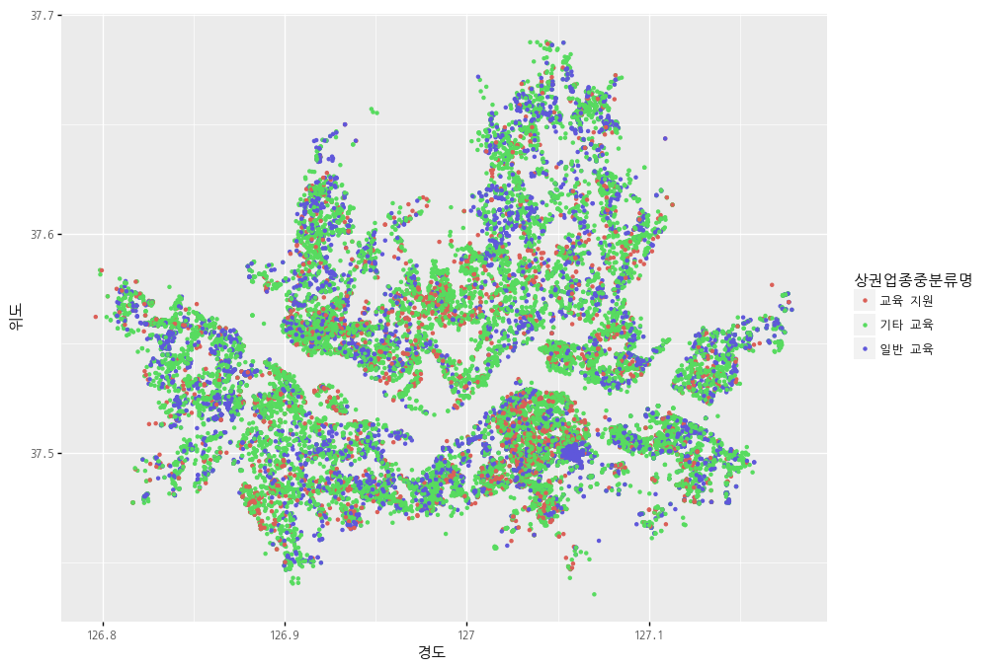

<ggplot: (-9223371918693359244)>

In [31]:
(
    ggplot(related_edu_seoul, aes(x = '경도', y = '위도', color = '상권업종중분류명'))
    + geom_point(size=0.8)
    + theme(text=element_text(family='NanumGothicCoding'), figure_size=[10, 8])
)

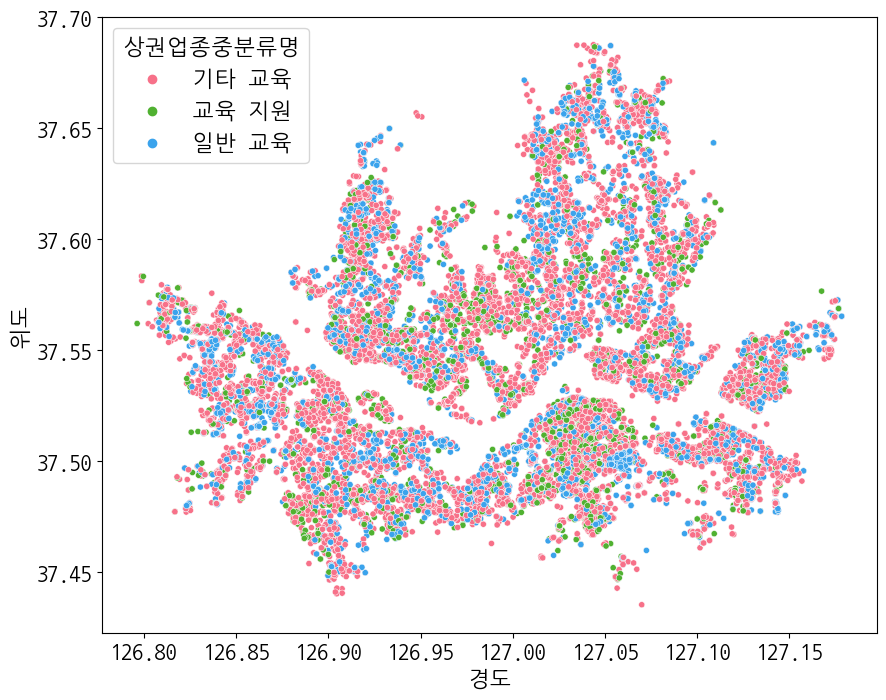

In [32]:
plt.figure(figsize=[10, 8])
sns.scatterplot(related_edu_seoul, x='경도', y='위도', hue='상권업종중분류명', s=20, palette='husl')
plt.show()

In [33]:
related_etc_edu_seoul = refined_df_seoul[refined_df_seoul['상권업종중분류명'] == '기타 교육']
related_etc_edu_seoul

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
2,나라차중계태권도장,NaN,교육,기타 교육,태권도/무술학원,서울특별시,노원구,중계본동,중계동,서울특별시 노원구 중계동 364-19,서울특별시 노원구 한글비석로 242,127.076956,37.649226,서울특별시,노원구,한글비석로
11,볼벤,NaN,교육,기타 교육,기타 기술/직업 훈련학원,서울특별시,마포구,성산1동,성산동,서울특별시 마포구 성산동 214-20,서울특별시 마포구 월드컵로30다길 41,126.908665,37.562237,서울특별시,마포구,월드컵로30다길
27,엑스퍼트짐,NaN,교육,기타 교육,레크리에이션 교육기관,서울특별시,은평구,응암3동,응암동,서울특별시 은평구 응암동 119-1,서울특별시 은평구 응암로 269,126.918749,37.596001,서울특별시,은평구,응암로
39,율립연구소,NaN,교육,기타 교육,요가/필라테스 학원,서울특별시,송파구,위례동,장지동,서울특별시 송파구 장지동 881,서울특별시 송파구 위례광장로 188,127.142381,37.481079,서울특별시,송파구,위례광장로
66,춤연,NaN,교육,기타 교육,기타 예술/스포츠 교육기관,서울특별시,서초구,양재1동,양재동,서울특별시 서초구 양재동 89-4,서울특별시 서초구 양재천로29길 3,127.042226,37.479264,서울특별시,서초구,양재천로29길
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475143,제니필라테스withK.D,NaN,교육,기타 교육,요가/필라테스 학원,서울특별시,서초구,잠원동,잠원동,서울특별시 서초구 잠원동 50-6,서울특별시 서초구 나루터로 43,127.014618,37.515251,서울특별시,서초구,나루터로
475151,룩스필라테스방화역점,NaN,교육,기타 교육,요가/필라테스 학원,서울특별시,강서구,방화3동,방화동,서울특별시 강서구 방화동 830-1,서울특별시 강서구 금낭화로 136,126.812985,37.577343,서울특별시,강서구,금낭화로
475195,클레프온음악교습소,NaN,교육,기타 교육,음악학원,서울특별시,성동구,행당1동,행당동,서울특별시 성동구 행당동 380,서울특별시 성동구 고산자로2길 67,127.038026,37.556342,서울특별시,성동구,고산자로2길
475209,예히세라믹스,NaN,교육,기타 교육,기타 기술/직업 훈련학원,서울특별시,강북구,수유3동,수유동,서울특별시 강북구 수유동 197-13,서울특별시 강북구 삼각산로 122-11,127.017931,37.640298,서울특별시,강북구,삼각산로


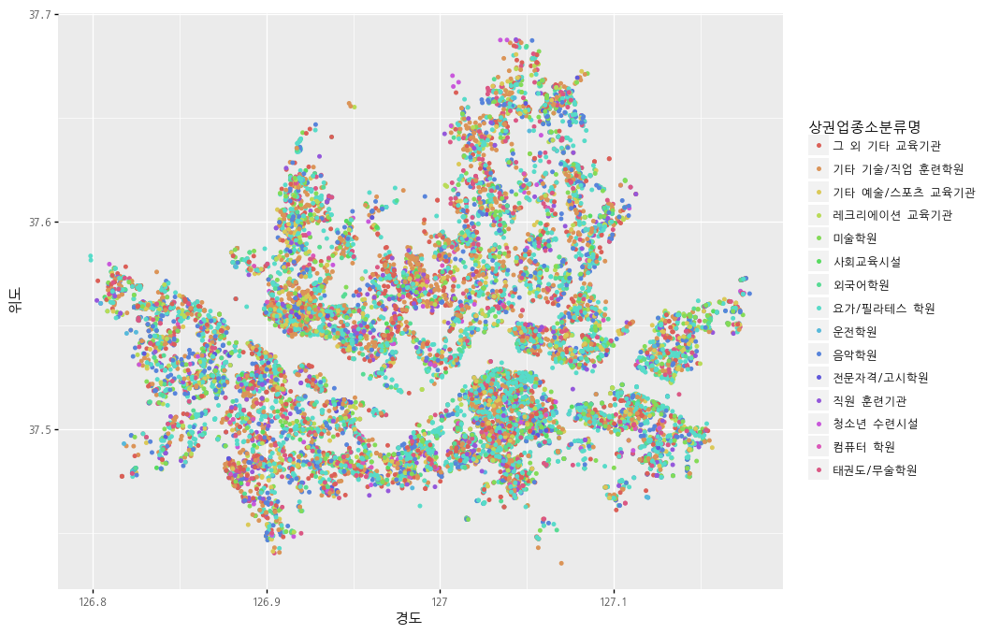

<ggplot: (-9223371918669013493)>

In [34]:
(
    ggplot(related_etc_edu_seoul, aes(x = '경도', y = '위도', color = '상권업종소분류명'))
    + geom_point(size=1)
    + theme(text=element_text(family='NanumGothicCoding'), figure_size=[10, 8])
)

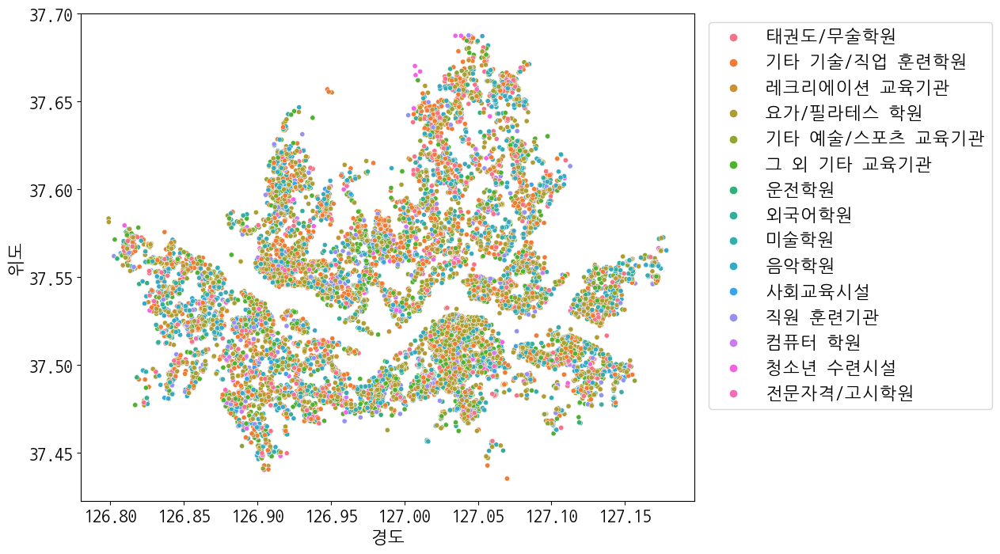

In [35]:
plt.figure(figsize=[10, 8])
p = sns.scatterplot(related_etc_edu_seoul, x='경도', y='위도', hue='상권업종소분류명', s=20, palette='husl')
p.legend(loc='upper right', bbox_to_anchor=(1.5,1)) # 범례 위치, 차트 만든 후 사용한다.
plt.show()

In [36]:
related_support_edu_seoul = refined_df_seoul[refined_df_seoul['상권업종중분류명'] == '교육 지원']
related_support_edu_seoul

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
90,한국재무경영원,NaN,교육,교육 지원,기타 교육지원 서비스업,서울특별시,중구,필동,필동3가,서울특별시 중구 필동3가 21-7,서울특별시 중구 서애로 23,126.997263,37.560202,서울특별시,중구,서애로
184,에스포럼협동조합,NaN,교육,교육 지원,기타 교육지원 서비스업,서울특별시,영등포구,문래동,문래동3가,서울특별시 영등포구 문래동3가 55-20,서울특별시 영등포구 경인로 775,126.897525,37.514738,서울특별시,영등포구,경인로
251,아이비에듀케이션,NaN,교육,교육 지원,교육컨설팅업,서울특별시,동대문구,용신동,용두동,서울특별시 동대문구 용두동 100-1,서울특별시 동대문구 천호대로25길 81,127.033935,37.577808,서울특별시,동대문구,천호대로25길
514,종로유학원,NaN,교육,교육 지원,기타 교육지원 서비스업,서울특별시,서초구,서초4동,서초동,서울특별시 서초구 서초동 1318,서울특별시 서초구 강남대로61길 3,127.026455,37.499157,서울특별시,서초구,강남대로61길
715,차민,NaN,교육,교육 지원,기타 교육지원 서비스업,서울특별시,서대문구,신촌동,창천동,서울특별시 서대문구 창천동 503-8,서울특별시 서대문구 신촌로 25,126.929609,37.557986,서울특별시,서대문구,신촌로
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
474795,씨엠씨컨설팅,NaN,교육,교육 지원,기타 교육지원 서비스업,서울특별시,강남구,압구정동,신사동,서울특별시 강남구 신사동 588-1,서울특별시 강남구 논현로152길 26,127.030331,37.521274,서울특별시,강남구,논현로152길
474860,위드힐정신건강연구소,NaN,교육,교육 지원,교육컨설팅업,서울특별시,도봉구,도봉2동,도봉동,서울특별시 도봉구 도봉동 634-9,서울특별시 도봉구 마들로 686,127.046643,37.671376,서울특별시,도봉구,마들로
474913,넥스트챌린지랩스,NaN,교육,교육 지원,교육컨설팅업,서울특별시,서대문구,신촌동,대현동,서울특별시 서대문구 대현동 56-2,서울특별시 서대문구 이화여대길 59,126.945147,37.558982,서울특별시,서대문구,이화여대길
474955,크로스로드아카데미,NaN,교육,교육 지원,기타 교육지원 서비스업,서울특별시,송파구,가락본동,가락동,서울특별시 송파구 가락동 10-7,서울특별시 송파구 중대로 207,127.126427,37.500488,서울특별시,송파구,중대로


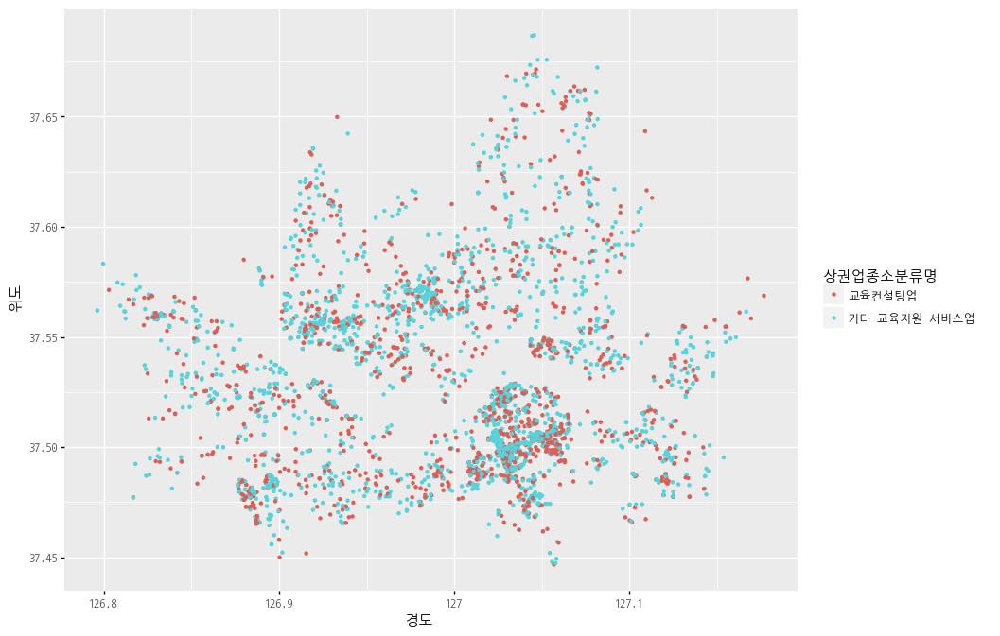

<ggplot: (118184648880)>

In [37]:
(
    ggplot(related_support_edu_seoul, aes(x = '경도', y = '위도', color = '상권업종소분류명'))
    + geom_point(size=0.8)
    + theme(text=element_text(family='NanumGothicCoding'), figure_size=[10, 8])
)

In [38]:
related_common_edu_seoul = refined_df_seoul[refined_df_seoul['상권업종중분류명'] == '일반 교육']
related_common_edu_seoul

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
122,메타인프렙입시컨설팅학원,NaN,교육,일반 교육,입시·교과학원,서울특별시,서초구,서초3동,서초동,서울특별시 서초구 서초동 1542-5,서울특별시 서초구 서초대로42길 12,127.008519,37.491412,서울특별시,서초구,서초대로42길
158,지아이에스강남인터내셔널스쿨,NaN,교육,일반 교육,입시·교과학원,서울특별시,서초구,내곡동,내곡동,서울특별시 서초구 내곡동 1-1969,서울특별시 서초구 샘마을2길 33,127.072451,37.459799,서울특별시,서초구,샘마을2길
215,생수학원,NaN,교육,일반 교육,입시·교과학원,서울특별시,강남구,대치2동,대치동,서울특별시 강남구 대치동 977-16,서울특별시 강남구 삼성로64길 51,127.064442,37.501095,서울특별시,강남구,삼성로64길
216,목동진학학원,NaN,교육,일반 교육,입시·교과학원,서울특별시,구로구,개봉1동,개봉동,서울특별시 구로구 개봉동 476,서울특별시 구로구 경인로 382,126.863054,37.496382,서울특별시,구로구,경인로
218,니키앤로라영어학원,NaN,교육,일반 교육,입시·교과학원,서울특별시,송파구,방이1동,방이동,서울특별시 송파구 방이동 201-3,서울특별시 송파구 위례성대로16길 27,127.124084,37.510373,서울특별시,송파구,위례성대로16길
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
474957,고귀한국어,NaN,교육,일반 교육,입시·교과학원,서울특별시,마포구,신수동,구수동,서울특별시 마포구 구수동 23-1,서울특별시 마포구 토정로 197-16,126.933177,37.545909,서울특별시,마포구,토정로
475025,좋은학원,NaN,교육,일반 교육,입시·교과학원,서울특별시,마포구,신수동,신수동,서울특별시 마포구 신수동 93-9,서울특별시 마포구 광성로 41-7,126.937247,37.550171,서울특별시,마포구,광성로
475159,한수학학원,NaN,교육,일반 교육,입시·교과학원,서울특별시,강동구,성내3동,성내동,서울특별시 강동구 성내동 427-57,서울특별시 강동구 양재대로89길 32,127.133756,37.526907,서울특별시,강동구,양재대로89길
475197,생동력연구소,NaN,교육,일반 교육,입시·교과학원,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 역삼동 831,서울특별시 강남구 강남대로 354,127.029714,37.494642,서울특별시,강남구,강남대로


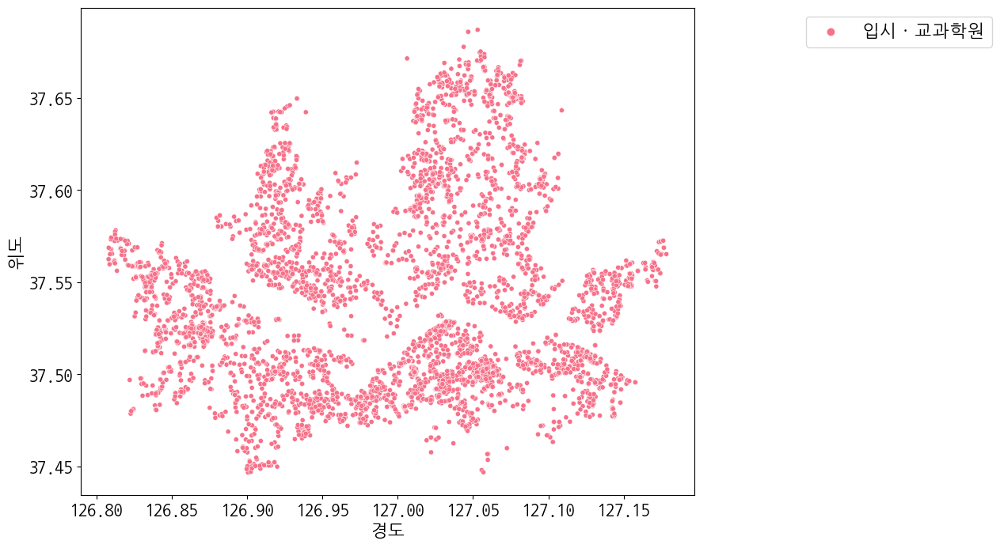

In [39]:
plt.figure(figsize=[10, 8])
p = sns.scatterplot(related_common_edu_seoul, x='경도', y='위도', hue='상권업종소분류명', s=20, palette='husl')
p.legend(loc='upper right', bbox_to_anchor=(1.5,1)) # 범례 위치, 차트 만든 후 사용한다.
plt.show()

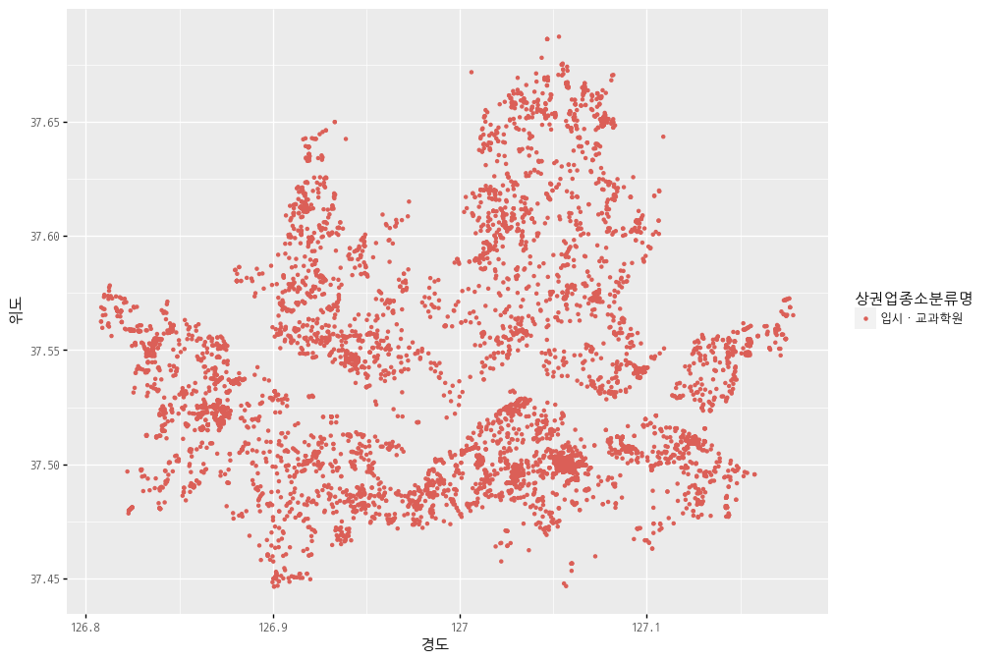

<ggplot: (-9223371918667149259)>

In [40]:
(
    ggplot(related_common_edu_seoul, aes(x = '경도', y = '위도', color = '상권업종소분류명'))
    + geom_point(size=0.8)
    + theme(text=element_text(family='NanumGothicCoding'), figure_size=[10, 8])
)

***
부동산과 관련된 정보 시각화
***

In [41]:
related_real_estate_seoul = refined_df_seoul[refined_df_seoul['상권업종대분류명'] == '부동산']
related_real_estate_seoul

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
21,나루공인중개사사무소,NaN,부동산,부동산 서비스,부동산 중개/대리업,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 역삼동 702-10,서울특별시 강남구 테헤란로 311,127.044843,37.503740,서울특별시,강남구,테헤란로
23,119래미안로이파크공인중개사사무소,NaN,부동산,부동산 서비스,부동산 중개/대리업,서울특별시,동작구,사당3동,사당동,서울특별시 동작구 사당동 1159,서울특별시 동작구 사당로23길 112,126.973457,37.487788,서울특별시,동작구,사당로23길
49,동인공인중개사사무소,NaN,부동산,부동산 서비스,부동산 중개/대리업,서울특별시,관악구,대학동,신림동,서울특별시 관악구 신림동 1515-16,서울특별시 관악구 신림로 119,126.936045,37.470688,서울특별시,관악구,신림로
130,더빌딩부동산중개법인,NaN,부동산,부동산 서비스,부동산 중개/대리업,서울특별시,강남구,삼성2동,삼성동,서울특별시 강남구 삼성동 143-37,서울특별시 강남구 테헤란로 423,127.053045,37.506212,서울특별시,강남구,테헤란로
161,시트러스에셋,NaN,부동산,부동산 서비스,부동산 중개/대리업,서울특별시,서초구,반포1동,반포동,서울특별시 서초구 반포동 736-2,서울특별시 서초구 강남대로85길 5,127.022582,37.507361,서울특별시,서초구,강남대로85길
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475071,조은집공인중개사사무소,NaN,부동산,부동산 서비스,부동산 중개/대리업,서울특별시,동대문구,장안1동,장안동,서울특별시 동대문구 장안동 216-29,서울특별시 동대문구 장한로5길 72,127.062964,37.565905,서울특별시,동대문구,장한로5길
475104,고덕독일489-4100공인중개사사무소,NaN,부동산,부동산 서비스,부동산 중개/대리업,서울특별시,강동구,고덕2동,고덕동,서울특별시 강동구 고덕동 693,서울특별시 강동구 고덕로 353,127.164398,37.556908,서울특별시,강동구,고덕로
475189,스타부동산공인중개사사무소,NaN,부동산,부동산 서비스,부동산 중개/대리업,서울특별시,마포구,서교동,서교동,서울특별시 마포구 서교동 405-1,서울특별시 마포구 잔다리로 17,126.921023,37.550646,서울특별시,마포구,잔다리로
475211,굿모닝고래힐부동산중개,NaN,부동산,부동산 서비스,부동산 중개/대리업,서울특별시,강동구,고덕1동,고덕동,서울특별시 강동구 고덕동 688,서울특별시 강동구 아리수로50길 50,127.148578,37.557678,서울특별시,강동구,아리수로50길


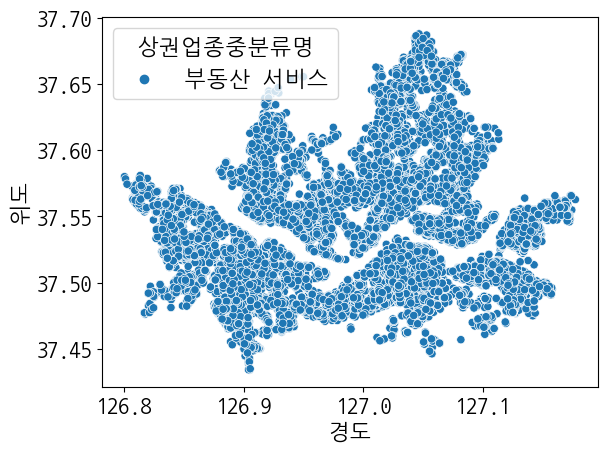

In [42]:
sns.scatterplot(related_real_estate_seoul, x='경도', y='위도', hue='상권업종중분류명')
plt.show()

***
컴퓨터 학원과 관련된 정보 시각화
***

In [43]:
related_computer_edu_seoul = refined_df_seoul[refined_df_seoul['상권업종소분류명']=='컴퓨터 학원']
related_computer_edu_seoul

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
2355,케이디지탈캠프,NaN,교육,기타 교육,컴퓨터 학원,서울특별시,강남구,역삼1동,역삼동,서울특별시 강남구 역삼동 642-24,서울특별시 강남구 테헤란로 151,127.036124,37.500975,서울특별시,강남구,테헤란로
8562,바나나코딩,NaN,교육,기타 교육,컴퓨터 학원,서울특별시,중구,회현동,남대문로5가,서울특별시 중구 남대문로5가 541,서울특별시 중구 한강대로 416,126.973740,37.555495,서울특별시,중구,한강대로
9854,잼코딩,NaN,교육,기타 교육,컴퓨터 학원,서울특별시,강남구,대치4동,대치동,서울특별시 강남구 대치동 923-16,서울특별시 강남구 선릉로64길 17,127.053655,37.498216,서울특별시,강남구,선릉로64길
12530,네오락,NaN,교육,기타 교육,컴퓨터 학원,서울특별시,서초구,반포1동,반포동,서울특별시 서초구 반포동 745,서울특별시 서초구 사평대로 335,127.019591,37.503452,서울특별시,서초구,사평대로
12667,정보보안아이티아카데미신촌,NaN,교육,기타 교육,컴퓨터 학원,서울특별시,마포구,대흥동,노고산동,서울특별시 마포구 노고산동 106-5,서울특별시 마포구 서강로 136,126.935778,37.554032,서울특별시,마포구,서강로
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
453827,휴몬랩코딩반포학원,NaN,교육,기타 교육,컴퓨터 학원,서울특별시,서초구,반포4동,반포동,서울특별시 서초구 반포동 55-6,서울특별시 서초구 고무래로8길 2,127.010507,37.502764,서울특별시,서초구,고무래로8길
456610,무궁화정보학원,NaN,교육,기타 교육,컴퓨터 학원,서울특별시,성동구,행당1동,행당동,서울특별시 성동구 행당동 245,서울특별시 성동구 왕십리로 287,127.036171,37.559778,서울특별시,성동구,왕십리로
463418,룩스디자인1212,NaN,교육,기타 교육,컴퓨터 학원,서울특별시,마포구,서교동,동교동,서울특별시 마포구 동교동 165-8,서울특별시 마포구 양화로 156,126.923434,37.556101,서울특별시,마포구,양화로
469963,아트클라슈,NaN,교육,기타 교육,컴퓨터 학원,서울특별시,서초구,양재2동,양재동,서울특별시 서초구 양재동 248-6,서울특별시 서초구 마방로4길 16-18,127.040257,37.473238,서울특별시,서초구,마방로4길


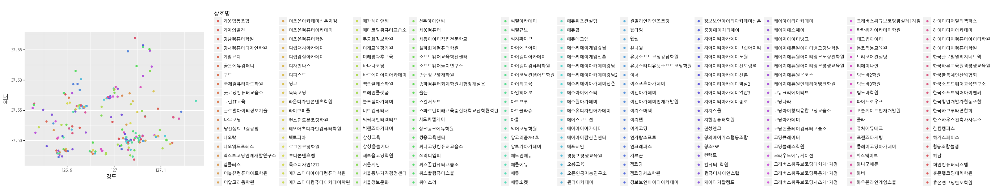

<ggplot: (-9223371918683978261)>

In [44]:
(
    ggplot(related_computer_edu_seoul, aes(x = '경도', y = '위도', color = '상호명'))
    + theme(text=element_text(family='NanumGothicCoding'))
    + geom_point()
)

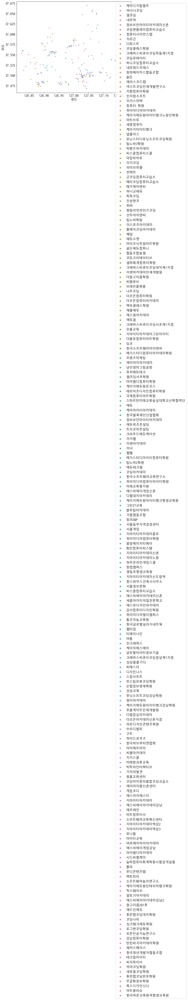

In [45]:
plt.figure(figsize=[10, 8])
p = sns.scatterplot(related_computer_edu_seoul, x='경도', y='위도', hue='상호명', s=20, palette='husl')
p.legend(loc='upper right', bbox_to_anchor=(1.5,1)) # 범례 위치, 차트 만든 후 사용한다.
plt.show()

***
folium을 이용한 컴퓨터학원 위치 시각화
***

In [46]:
#folium을 설치하고 지도를 만들었을 때 지도가 표시되지 않고 하얀 화면이 나오는 문제가 발생이 되었다.
# conda uninstall branca를 실행해서 branca 라이브러리를 제거하고 conda install folium을 실행해서
# 다시 설치했더니 정상적으로 지도가 표시되었다.
# pip install folium==0.12.1 설치하면 됨.
import folium

In [54]:
map_data = related_computer_edu_seoul
locate = related_computer_edu_seoul.mean()
computer_academy_map = folium.Map(location=[map_data.위도.mean(), map_data.경도.mean()], zoom_start=12)

'''
# iterrows() 메소드는 인덱스와 데이터를 튜플 형태로 반환한다.
for index, edu in map_data.iterrows():
    #print(edu.상호명)
    popup = folium.Popup(f'{edu.상호명}: {edu.도로명주소}', max_width=300)
    folium.Marker(location=[edu.위도, edu.경도], popup=popup,
                  icon=folium.Icon(color='darkred')).add_to(computer_academy_map)
#----- for index, edu
'''

for i in map_data.index:
    popup = folium.Popup('{}: {}'.format(map_data.loc[i, '상호명'], map_data.loc[i, '도로명주소']), max_width=300)
    folium.Marker(location=[map_data.loc[i, '위도'], map_data.loc[i, '경도']], popup=popup,
                  icon=folium.Icon(color='darkred')).add_to(computer_academy_map)
    
computer_academy_map.save('./output/computer_academy_map.htm')
computer_academy_map

In [115]:
set(refined_df_seoul.상권업종중분류명)

{'가구 소매',
 '가전·통신 소매',
 '가전제품 수리',
 '가정용품 대여',
 '고용 알선',
 '광고',
 '교육 지원',
 '구내식당·뷔페',
 '기술 서비스',
 '기타 가정용품 수리',
 '기타 간이',
 '기타 개인',
 '기타 교육',
 '기타 보건',
 '기타 사업 서비스',
 '기타 상품 소매',
 '기타 생활용품 소매',
 '기타 숙박',
 '기타 외국',
 '기타 전문 과학',
 '담배 소매',
 '도서관·사적지',
 '동남아시아',
 '모터사이클 소매',
 '모터사이클 수리',
 '법무관련 ',
 '병원',
 '본사·경영 컨설팅',
 '부동산 서비스',
 '비알코올 ',
 '사무 지원',
 '사진 촬영',
 '산업용품 대여',
 '서양식',
 '섬유·의복·신발 소매',
 '세탁',
 '수의',
 '스포츠 서비스',
 '시계·귀금속 소매',
 '시설관리',
 '시장 조사',
 '식료품 소매',
 '식물 소매',
 '안경·정밀기기 소매',
 '애완동물·용품 소매',
 '여행사·보조',
 '연료 소매',
 '오락용품 소매',
 '욕탕·신체관리',
 '운송장비 대여',
 '유원지·오락',
 '음료 소매',
 '의약·화장품 소매',
 '의원',
 '이용·미용',
 '인쇄·제품제작',
 '일반 교육',
 '일반 숙박',
 '일식',
 '자동차 부품 소매',
 '자동차 수리·세차',
 '장례식장 ',
 '장식품 소매',
 '전문 디자인',
 '조경·유지',
 '종합 소매',
 '주점',
 '중고 상품 소매',
 '중식',
 '철물·건설자재 소매',
 '청소·방제',
 '컴퓨터 수리',
 '통신장비 수리',
 '한식',
 '회계·세무'}

In [146]:
refined_df_seoul[refined_df_seoul.상호명.str.find('던킨') != -1]

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
15262,비알던킨도너츠신림양지병원,NaN,음식,기타 간이,빵/도넛,서울특별시,관악구,서원동,신림동,서울특별시 관악구 신림동 10-206,서울특별시 관악구 남부순환로 1640,126.932878,37.484301,서울특별시,관악구,남부순환로
21970,던킨도너츠동대문,NaN,음식,기타 간이,빵/도넛,서울특별시,종로구,종로5.6가동,종로6가,서울특별시 종로구 종로6가 289-3,서울특별시 종로구 종로 266,127.007311,37.570694,서울특별시,종로구,종로
23189,던킨도너츠목동남로점,NaN,음식,기타 간이,빵/도넛,서울특별시,구로구,고척2동,고척동,서울특별시 구로구 고척동 183-11,서울특별시 구로구 목동남로 6,126.860760,37.506713,서울특별시,구로구,목동남로
26585,던킨도너츠,NaN,음식,기타 간이,빵/도넛,서울특별시,광진구,구의1동,구의동,서울특별시 광진구 구의동 252-16,서울특별시 광진구 자양로 116,127.083736,37.538189,서울특별시,광진구,자양로
27547,던킨현대아이파크,NaN,음식,기타 간이,빵/도넛,서울특별시,강남구,삼성1동,삼성동,서울특별시 강남구 삼성동 160,서울특별시 강남구 영동대로 520,127.061119,37.513629,서울특별시,강남구,영동대로
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
446071,던킨,가든파이브점,음식,기타 간이,피자,서울특별시,송파구,문정2동,문정동,서울특별시 송파구 문정동 516,서울특별시 송파구 충민로 66,127.124941,37.477608,서울특별시,송파구,충민로
449593,던킨양재하나로점,NaN,음식,기타 간이,빵/도넛,서울특별시,서초구,양재2동,양재동,서울특별시 서초구 양재동 230,서울특별시 서초구 청계산로 10,127.043516,37.463218,서울특별시,서초구,청계산로
452654,던킨송파,방이점,음식,기타 간이,빵/도넛,서울특별시,송파구,오금동,오금동,서울특별시 송파구 오금동 19-2,서울특별시 송파구 마천로7길 5,127.127735,37.508589,서울특별시,송파구,마천로7길
454626,던킨NC신구로,NaN,음식,기타 간이,빵/도넛,서울특별시,구로구,구로5동,구로동,서울특별시 구로구 구로동 573,서울특별시 구로구 구로중앙로 152,126.882412,37.501144,서울특별시,구로구,구로중앙로


In [117]:
refined_df_seoul_cafe = refined_df_seoul[refined_df_seoul.상권업종소분류명 == '카페']
refined_df_seoul_cafe

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
10,카페숲,NaN,음식,비알코올,카페,서울특별시,금천구,시흥5동,시흥동,서울특별시 금천구 시흥동 929-10,서울특별시 금천구 시흥대로40길 129,126.909939,37.446689,서울특별시,금천구,시흥대로40길
72,매머드커피외대,NaN,음식,비알코올,카페,서울특별시,동대문구,이문1동,이문동,서울특별시 동대문구 이문동 264-223,서울특별시 동대문구 천장산로7길 16,127.056962,37.598493,서울특별시,동대문구,천장산로7길
74,포르마레,NaN,음식,비알코올,카페,서울특별시,강동구,성내1동,성내동,서울특별시 강동구 성내동 534-7,서울특별시 강동구 성내로9길 35,127.125070,37.530474,서울특별시,강동구,성내로9길
118,카페브릿지,NaN,음식,비알코올,카페,서울특별시,영등포구,여의동,여의도동,서울특별시 영등포구 여의도동 22,서울특별시 영등포구 여의대로 108,126.929094,37.525184,서울특별시,영등포구,여의대로
153,더웨이유통할리스커피,NaN,음식,비알코올,카페,서울특별시,중구,약수동,신당동,서울특별시 중구 신당동 368-66,서울특별시 중구 다산로 114,127.010407,37.553952,서울특별시,중구,다산로
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475179,빽다방빨래골,입구점,음식,비알코올,카페,서울특별시,강북구,수유1동,수유동,서울특별시 강북구 수유동 70-4,서울특별시 강북구 삼양로 293,127.017708,37.629745,서울특별시,강북구,삼양로
475212,청23,NaN,음식,비알코올,카페,서울특별시,마포구,서교동,동교동,서울특별시 마포구 동교동 113-85,서울특별시 마포구 연희로 23,126.926523,37.560923,서울특별시,마포구,연희로
475220,피트커피,NaN,음식,비알코올,카페,서울특별시,강동구,고덕2동,고덕동,서울특별시 강동구 고덕동 343-2,서울특별시 강동구 고덕비즈밸리로 26,127.160262,37.565439,서울특별시,강동구,고덕비즈밸리로
475223,빽다방동,여의도점,음식,비알코올,카페,서울특별시,영등포구,여의동,여의도동,서울특별시 영등포구 여의도동 43-4,서울특별시 영등포구 국제금융로 86,126.931779,37.520198,서울특별시,영등포구,국제금융로


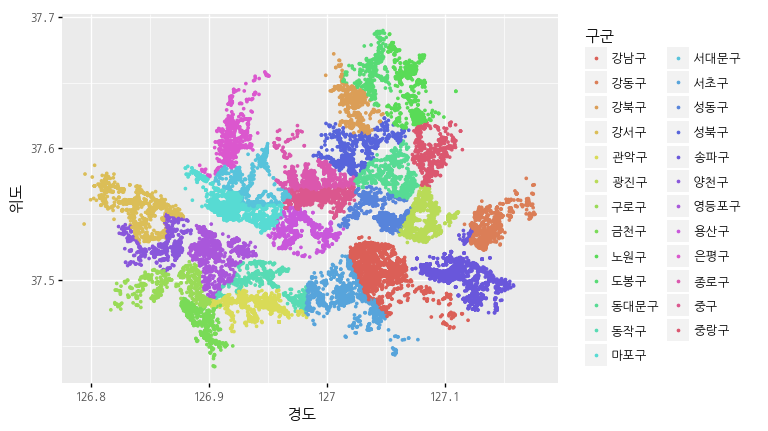

<ggplot: (118212390134)>

In [118]:
(
    ggplot(refined_df_seoul_cafe, aes(x = '경도', y = '위도', color = '구군'))
    + theme(text=element_text(family='NanumGothicCoding'))
    + geom_point(size=0.5)
)

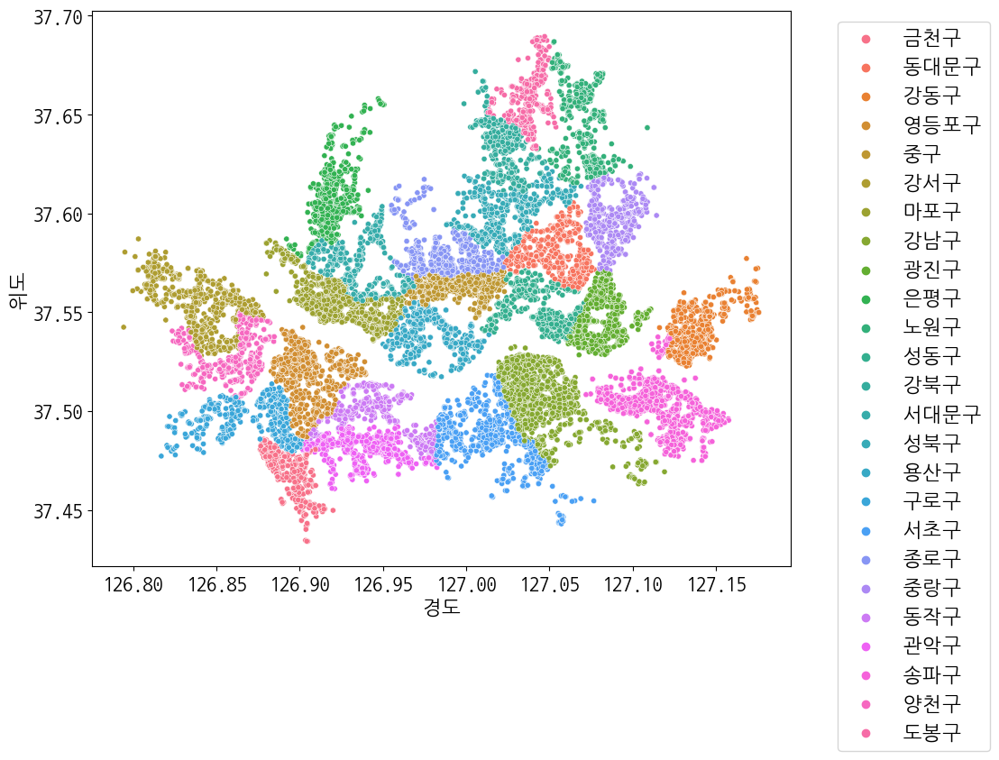

In [119]:
plt.figure(figsize=[10, 8])
p = sns.scatterplot(refined_df_seoul_cafe, x='경도', y='위도', hue='구군', s=20, palette='husl')
p.legend(loc=1, bbox_to_anchor=(1.3,1)) # 범례 위치, 차트 만든 후 사용한다.
plt.show()

***
이디야, 빽다방 시각화

In [134]:
cafe_map = folium.Map(location=[map_data.위도.mean(), map_data.경도.mean()], zoom_start=12)

map_data = refined_df_seoul_cafe[refined_df_seoul.상호명.str.find('이디야') != -1]
for index, cafe in map_data.iterrows():
    popup = folium.Popup(f'{cafe.상호명}: {cafe.도로명주소}', max_width=300)
    folium.CircleMarker(location=[cafe.위도, cafe.경도],
                        radius=2,
                        color='blue',
                        popup=popup,
                        icon=folium.Icon(color='darkred')).add_to(cafe_map)
#----- for index, edu

map_data = refined_df_seoul_cafe[refined_df_seoul.상호명.str.find('빽다방') != -1]
for index, cafe in map_data.iterrows():
    popup = folium.Popup(f'{cafe.상호명}: {cafe.도로명주소}', max_width=300)
    folium.CircleMarker(location=[cafe.위도, cafe.경도],
                        radius=2,
                        color='red',
                        popup=popup,
                        icon=folium.Icon(color='darkred')).add_to(cafe_map)
#----- for index, edu

    
cafe_map.save('./output/cafe_map.htm')
cafe_map

In [145]:
refined_df_seoul_etc = refined_df_seoul[refined_df_seoul.상권업종중분류명 == '기타 간이']
refined_df_seoul_etc

,상호명,지점명,상권업종대분류명,상권업종중분류명,상권업종소분류명,시도명,시군구명,행정동명,법정동명,지번주소,도로명주소,경도,위도,시도,구군,도로명
6,비에이치씨항동점,NaN,음식,기타 간이,치킨,서울특별시,구로구,항동,항동,서울특별시 구로구 항동 100-5,서울특별시 구로구 연동로 233,126.820686,37.481640,서울특별시,구로구,연동로
12,샐러드점보,NaN,음식,기타 간이,피자,서울특별시,영등포구,신길3동,신길동,서울특별시 영등포구 신길동 257-33,서울특별시 영등포구 가마산로71길 7-1,126.909248,37.506729,서울특별시,영등포구,가마산로71길
16,이가네꽈배기,NaN,음식,기타 간이,빵/도넛,서울특별시,금천구,독산3동,독산동,서울특별시 금천구 독산동 986,서울특별시 금천구 시흥대로144길 26,126.900846,37.473384,서울특별시,금천구,시흥대로144길
24,노랑통닭금천,NaN,음식,기타 간이,치킨,서울특별시,금천구,시흥5동,시흥동,서울특별시 금천구 시흥동 837-51,서울특별시 금천구 금하로 687,126.906537,37.452136,서울특별시,금천구,금하로
36,올도우,NaN,음식,기타 간이,빵/도넛,서울특별시,서대문구,홍제1동,홍제동,서울특별시 서대문구 홍제동 332-3,서울특별시 서대문구 통일로39길 22-25,126.942887,37.588327,서울특별시,서대문구,통일로39길
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
475164,빠네뚜,NaN,음식,기타 간이,그 외 기타 간이 음식점,서울특별시,노원구,월계1동,월계동,서울특별시 노원구 월계동 383-27,서울특별시 노원구 광운로 60,127.059964,37.622647,서울특별시,노원구,광운로
475186,포케올데이,종로점,음식,기타 간이,토스트/샌드위치/샐러드,서울특별시,종로구,종로1.2.3.4가동,관수동,서울특별시 종로구 관수동 4-4,서울특별시 종로구 종로16길 11,126.988693,37.569563,서울특별시,종로구,종로16길
475190,딜리셔스치킨,NaN,음식,기타 간이,치킨,서울특별시,동대문구,용신동,용두동,서울특별시 동대문구 용두동 232-33,서울특별시 동대문구 한빛로 58-1,127.029032,37.578741,서울특별시,동대문구,한빛로
475210,정성한줄,NaN,음식,기타 간이,김밥/만두/분식,서울특별시,강남구,대치1동,대치동,서울특별시 강남구 대치동 1021-10,서울특별시 강남구 삼성로 237,127.060846,37.498345,서울특별시,강남구,삼성로


***
배스킨라빈스, 던킨도너츠, 파리바게뜨, 뚜레쥬르 시각화

In [149]:
etc_map = folium.Map(location=[map_data.위도.mean(), map_data.경도.mean()], zoom_start=12)

map_data = refined_df_seoul_etc[refined_df_seoul.상호명.str.find('라빈스') != -1]
for index, food in map_data.iterrows():
    popup = folium.Popup(f'{food.상호명}: {food.도로명주소}', max_width=300)
    folium.CircleMarker(location=[food.위도, food.경도],
                        radius=2,
                        color='blue',
                        popup=popup,
                        icon=folium.Icon(color='darkred')).add_to(etc_map)
#----- for index, edu

map_data = refined_df_seoul_etc[refined_df_seoul.상호명.str.find('던킨') != -1]
for index, food in map_data.iterrows():
    popup = folium.Popup(f'{food.상호명}: {food.도로명주소}', max_width=300)
    folium.CircleMarker(location=[food.위도, food.경도],
                        radius=2,
                        color='red',
                        popup=popup,
                        icon=folium.Icon(color='darkred')).add_to(etc_map)
#----- for index, edu

map_data = refined_df_seoul_etc[refined_df_seoul.상호명.str.find('파리바게') != -1]
for index, food in map_data.iterrows():
    popup = folium.Popup(f'{food.상호명}: {food.도로명주소}', max_width=300)
    folium.CircleMarker(location=[food.위도, food.경도],
                        radius=2,
                        color='green',
                        popup=popup,
                        icon=folium.Icon(color='darkred')).add_to(etc_map)
#----- for index, edu

map_data = refined_df_seoul_etc[refined_df_seoul.상호명.str.find('뚜레') != -1]
for index, food in map_data.iterrows():
    popup = folium.Popup(f'{food.상호명}: {food.도로명주소}', max_width=300)
    folium.CircleMarker(location=[food.위도, food.경도],
                        radius=2,
                        color='purple',
                        popup=popup,
                        icon=folium.Icon(color='darkred')).add_to(etc_map)
#----- for index, edu

    
etc_map.save('./output/etc_map.htm')
etc_map

***
구군별 카페 시각화

In [182]:
refined_df_seoul_cafe_count = refined_df_seoul_cafe.groupby('구군').상호명.count()
refined_df_seoul_cafe_count

구군
강남구     2027
강동구      700
강북구      475
강서구      976
관악구      761
광진구      758
구로구      571
금천구      522
노원구      627
도봉구      380
동대문구     663
동작구      592
마포구     1895
서대문구     646
서초구     1164
성동구      770
성북구      756
송파구     1305
양천구      554
영등포구    1105
용산구      810
은평구      615
종로구     1161
중구       967
중랑구      525
Name: 상호명, dtype: int64

In [183]:
refined_df_seoul_cafe_lat = refined_df_seoul_cafe.groupby('구군').위도.mean()
refined_df_seoul_cafe_lat

구군
강남구     37.505904
강동구     37.542484
강북구     37.632617
강서구     37.555707
관악구     37.480297
광진구     37.546255
구로구     37.494158
금천구     37.469338
노원구     37.643322
도봉구     37.658541
동대문구    37.581126
동작구     37.498084
마포구     37.556179
서대문구    37.570522
서초구     37.487972
성동구     37.551216
성북구     37.597654
송파구     37.501160
양천구     37.527525
영등포구    37.519538
용산구     37.537138
은평구     37.609759
종로구     37.577301
중구      37.562688
중랑구     37.596672
Name: 위도, dtype: float64

In [189]:
refined_df_seoul_cafe_lot = refined_df_seoul_cafe.groupby('구군').경도.mean()
refined_df_seoul_cafe_lot

pandas.core.series.Series

In [190]:
refined_df_seoul_cafe_concat = pd.concat([refined_df_seoul_cafe_count,
                                          refined_df_seoul_cafe_lat,
                                          refined_df_seoul_cafe_lot], axis=1)
#refined_df_seoul_cafe_concat.columns = ['매장수', '위도', '경도']
refined_df_seoul_cafe_concat = refined_df_seoul_cafe_concat.rename(columns= {'상호명' : '매장수'})
refined_df_seoul_cafe_concat

,매장수,위도,경도
구군,,,
강남구,2027,37.505904,127.044859
강동구,700,37.542484,127.139434
강북구,475,37.632617,127.022905
강서구,976,37.555707,126.838939
관악구,761,37.480297,126.939705
광진구,758,37.546255,127.081267
구로구,571,37.494158,126.872966
금천구,522,37.469338,126.892023
노원구,627,37.643322,127.069359


In [209]:
cafe_map1 = folium.Map(location=[map_data.위도.mean(), map_data.경도.mean()], zoom_start=12)

map_data = refined_df_seoul_cafe_concat
for index, cafe1 in map_data.iterrows():
    popup = folium.Popup('{}: {:,.0f}'.format(index, cafe1.매장수), max_width=300)
    folium.CircleMarker(location=[cafe1.위도, cafe1.경도],
                        radius= (cafe1.매장수 / 25),
                        fill_color='red',
                        color='thistle',
                        popup=popup,
                        icon=folium.Icon(color='darkred')).add_to(cafe_map1)
#----- for index, edu

cafe_map1.save('./output/cafe_map1.htm')
cafe_map1